# Library imports

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from collections import Counter
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from sklearn.feature_extraction.text import CountVectorizer
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import warnings
from collections import Counter
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import os
import time
import copy
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from transformers import (set_seed,
                          TrainingArguments,
                          Trainer,
                          AdamW,
                          get_linear_schedule_with_warmup)

#machine learning tools
import torch
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support, accuracy_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from transformers import TrainingArguments, Trainer
from transformers import EarlyStoppingCallback
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.metrics import f1_score

In [6]:
warnings.filterwarnings("ignore")

# Loading the data

In [7]:
from google.colab import drive
drive.mount('/content/drive')

# Assuming the file is in the root of your Google Drive
df = pd.read_csv('/content/drive/My Drive/phishing_email.csv')

Mounted at /content/drive


# Checking the class distribution

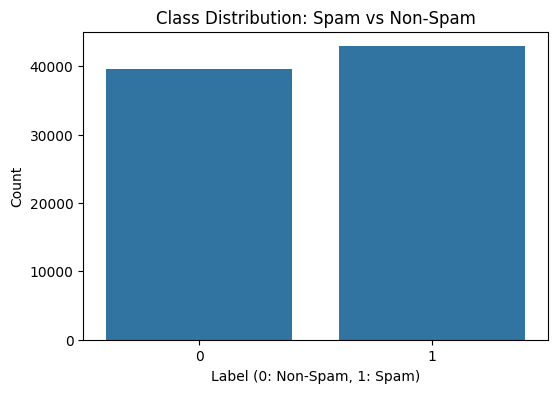

label
1    0.519979
0    0.480021
Name: proportion, dtype: float64


In [7]:
# Plot class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=df)
plt.title('Class Distribution: Spam vs Non-Spam')
plt.xlabel('Label (0: Non-Spam, 1: Spam)')
plt.ylabel('Count')
plt.show()

# Calculate and print class distribution
class_distribution = df['label'].value_counts(normalize=True)
print(class_distribution)

### The class distribution is practically balanced, with approximately 52% spam emails and 48% non-spam emails. This means that no balance adjustments have to be made during the model training.

# Text length analysis


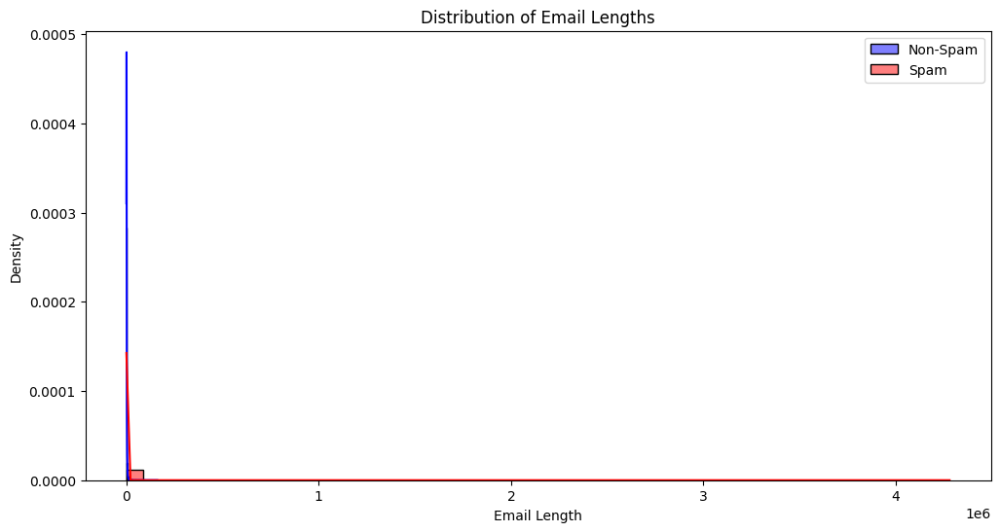

Statistics of Spam Emails Lengths:
count    4.289100e+04
mean     1.060414e+03
std      2.119270e+04
min      1.000000e+00
25%      2.410000e+02
50%      3.910000e+02
75%      1.058000e+03
max      4.279526e+06
Name: text_length, dtype: float64
Statistics of Non-Spam Emails Lengths:
count     39595.000000
mean       1536.096098
std        3695.897909
min          11.000000
25%         411.000000
50%         779.000000
75%        1493.000000
max      160318.000000
Name: text_length, dtype: float64


In [8]:
# Calculate the length of each email
df['text_length'] = df['text_combined'].apply(len)

# Plot the distribution of email lengths for spam and non-spam emails
plt.figure(figsize=(12,6))
sns.histplot(df[df['label'] == 0]['text_length'], bins=50, color='blue', label='Non-Spam', kde=True, stat="density")
sns.histplot(df[df['label'] == 1]['text_length'], bins=50, color='red', label='Spam', kde=True, stat="density")
plt.title('Distribution of Email Lengths')
plt.xlabel('Email Length')
plt.ylabel('Density')
plt.legend()
plt.show()

# Calculate and display summary statistics of email lengths
spam_length_stats = df[df['label'] == 1]['text_length'].describe()
non_spam_length_stats = df[df['label'] == 0]['text_length'].describe()
print("Statistics of Spam Emails Lengths:")
print(spam_length_stats)
print("Statistics of Non-Spam Emails Lengths:")
print(non_spam_length_stats)

### The distribution of email lengths shows that:

#### Non-Spam Emails:

1) Mean length: 1536 characters
2) Median length: 779 characters
3) Minimum length: 11 characters
4) Maximum length: 160,318 characters

#### Spam Emails:

1) Mean length: 1060 characters
2) Median length: 391 characters
3) Minimum length: 1 character
4) Maximum length: 4,279,526 characters

Spam emails tend to be shorter on average compared to non-spam emails. However, there are some extreme outliers in both categories, especially when looking in the spam emails.

# Top Words Analysis
Using the word cloud library, we'll be able to visualize the most commonly used words in the Spam and Not Spam Emails


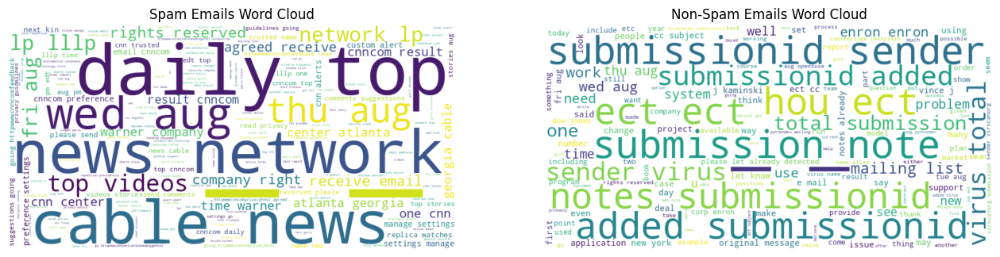

In [9]:
# Generate word clouds for spam and non-spam emails
spam_text = ' '.join(df[df['label'] == 1]['text_combined'])
non_spam_text = ' '.join(df[df['label'] == 0]['text_combined'])

spam_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(spam_text)
non_spam_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(non_spam_text)

# Plot the word clouds
plt.figure(figsize=(16,8))

plt.subplot(1, 2, 1)
plt.imshow(spam_wordcloud, interpolation='bilinear')
plt.title('Spam Emails Word Cloud')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(non_spam_wordcloud, interpolation='bilinear')
plt.title('Non-Spam Emails Word Cloud')
plt.axis('off')

plt.show()

Finding the most common words in spam and non-spam emails

In [10]:
# Function to remove numbers and underscores
def clean_tokens(tokens):
    return [word for word in tokens if word.isalpha() and word != '_']

# Tokenize and remove stop words, numbers, and underscores
df['tokens'] = df['text_combined'].apply(lambda x: clean_tokens([word for word in x.split() if word.lower() not in ENGLISH_STOP_WORDS]))

# Get most common words in spam and non-spam emails
spam_words = Counter([word for tokens in df[df['label'] == 1]['tokens'] for word in tokens])
non_spam_words = Counter([word for tokens in df[df['label'] == 0]['tokens'] for word in tokens])

# Display the most common words
print('Most common words in spam emails:', spam_words.most_common(10))
print('Most common words in non-spam emails:', non_spam_words.most_common(10))


Most common words in spam emails: [('aug', 28037), ('email', 26289), ('company', 18244), ('money', 17829), ('account', 16337), ('news', 15935), ('cnncom', 14533), ('time', 14143), ('information', 12929), ('daily', 12242)]
Most common words in non-spam emails: [('enron', 53880), ('ect', 34721), ('submissionid', 32246), ('new', 24807), ('submission', 21027), ('added', 20790), ('aug', 19831), ('sender', 19298), ('notes', 19296), ('list', 18532)]


### We can see that 'enron' is a really common word in non-spam emails, and that 'cnncom' is a common word in spam emails which also sounds like a company that spam emails might be trying to advertise.
### We create two new binary columns: 'contain_enron' & 'contain_cnncom'

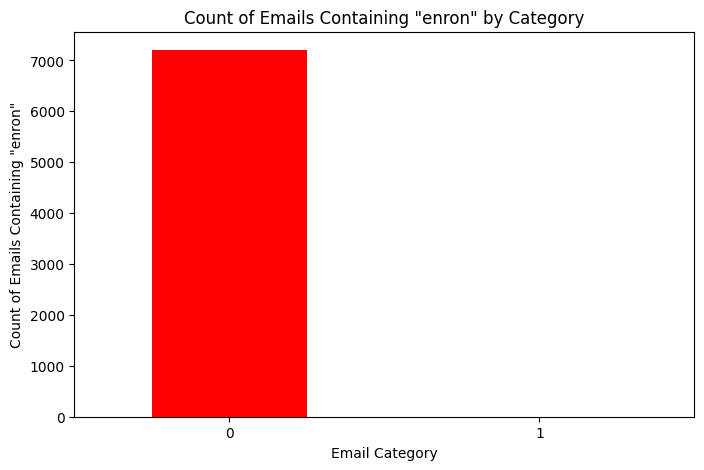

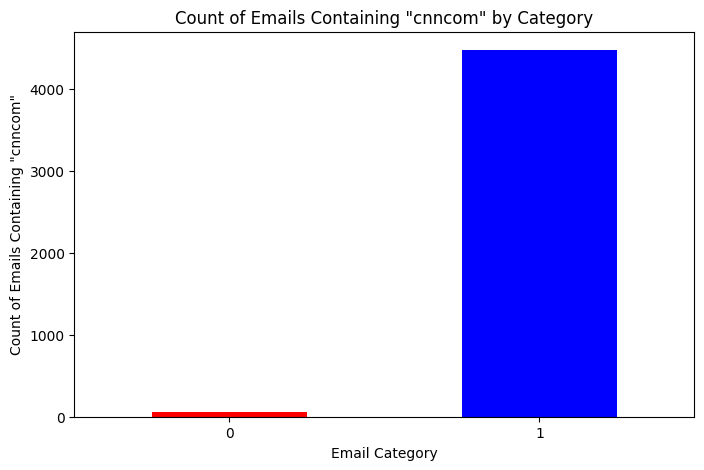

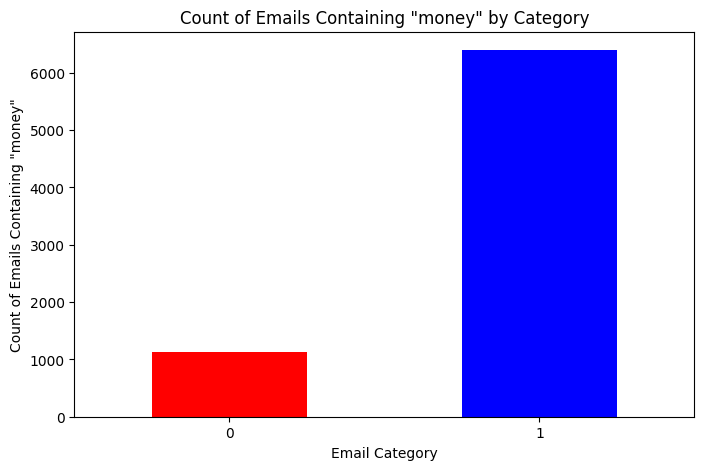

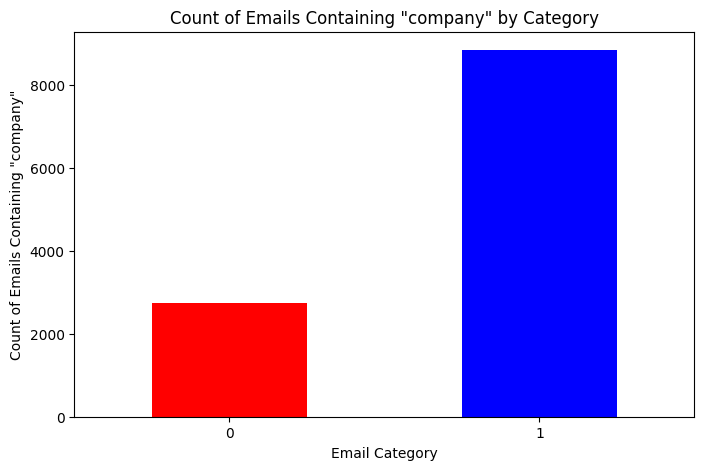

In [11]:
key_words = ['enron', 'cnncom', 'money', 'company']

# Create the 'contain_enron' column
df['contain_enron'] = df['text_combined'].apply(lambda text: 1 if 'enron' in text.lower() else 0)
df['contain_cnncom'] = df['text_combined'].apply(lambda text: 1 if 'cnncom' in text.lower() else 0)
df['contain_submissionid'] = df['text_combined'].apply(lambda text: 1 if 'money' in text.lower() else 0)
df['contain_company'] = df['text_combined'].apply(lambda text: 1 if 'company' in text.lower() else 0)


# Calculate the count of spam and non-spam emails that contain 'enron'
count_df_enron = df[df['contain_enron'] == 1].groupby('label')['contain_enron'].count()
count_df_cnncom = df[df['contain_cnncom'] == 1].groupby('label')['contain_cnncom'].count()
count_df_submissionid = df[df['contain_submissionid'] == 1].groupby('label')['contain_submissionid'].count()
count_df_company = df[df['contain_company'] == 1].groupby('label')['contain_company'].count()


for word in key_words:
  # Plotting the results
  plt.figure(figsize=(8, 5))
  if word == 'enron':
    count_df_enron.plot(kind='bar', color=['red', 'blue'])
  elif word == 'cnncom':
        count_df_cnncom.plot(kind='bar', color=['red', 'blue'])
  elif word == 'money':
        count_df_submissionid.plot(kind='bar', color=['red', 'blue'])
  elif word == 'company':
        count_df_company.plot(kind='bar', color=['red', 'blue'])
  plt.title(f'Count of Emails Containing "{word}" by Category')
  plt.ylabel(f'Count of Emails Containing "{word}"')
  plt.xlabel('Email Category')
  plt.xticks(rotation=0)
  plt.show()



## Counting number and punctuation marks

Average number count in spam emails: 68.33153808491292
Average number count in non-spam emails: 82.47766132087385
Average punctuation marks count in spam emails: 4.297008696463127
Average punctuation marks in non-spam emails: 13.371713600202046


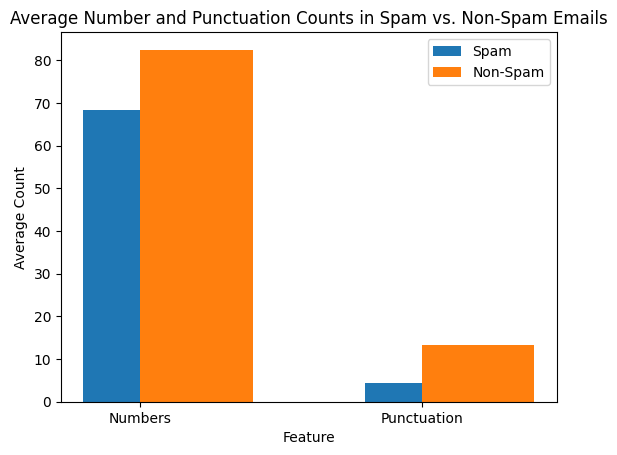

In [12]:
import string
import matplotlib.pyplot as plt

# Function to count numbers in text
def count_numbers(text):
    return sum(1 for char in text if char.isdigit())

# Function to count punctuation in text
def count_punctuation(text):
    return sum(1 for char in text if char in string.punctuation)

# Apply the functions to the dataset
df['num_count'] = df['text_combined'].apply(count_numbers)
df['punct_count'] = df['text_combined'].apply(count_punctuation)

# Calculate average counts for spam and non-spam emails
avg_num_count_spam = df[df['label'] == 1]['num_count'].mean()
avg_num_count_non_spam = df[df['label'] == 0]['num_count'].mean()
avg_punct_count_spam = df[df['label'] == 1]['punct_count'].mean()
avg_punct_count_non_spam = df[df['label'] == 0]['punct_count'].mean()

# Print the means
print(f"Average number count in spam emails: {avg_num_count_spam}")
print(f"Average number count in non-spam emails: {avg_num_count_non_spam}")
print(f"Average punctuation marks count in spam emails: {avg_punct_count_spam}")
print(f"Average punctuation marks in non-spam emails: {avg_punct_count_non_spam}")


# Plotting the results
labels = ['Numbers', 'Punctuation']
spam_counts = [avg_num_count_spam, avg_punct_count_spam]
non_spam_counts = [avg_num_count_non_spam, avg_punct_count_non_spam]

x = range(len(labels))

fig, ax = plt.subplots()
ax.bar(x, spam_counts, width=0.4, label='Spam', align='center')
ax.bar(x, non_spam_counts, width=0.4, label='Non-Spam', align='edge')
ax.set_xlabel('Feature')
ax.set_ylabel('Average Count')
ax.set_title('Average Number and Punctuation Counts in Spam vs. Non-Spam Emails')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.show()


## Counting characters, words and sentences

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Average word count in spam emails: 121.34254272458091
Average word count in non-spam emails: 203.1820684429852
Average sentence count in spam emails: 0.9999766850854491
Average sentence count in non-spam emails: 1.0
Average character count in spam emails: 1060.4137931034484
Average character count in non-spam emails: 1536.0960979921708


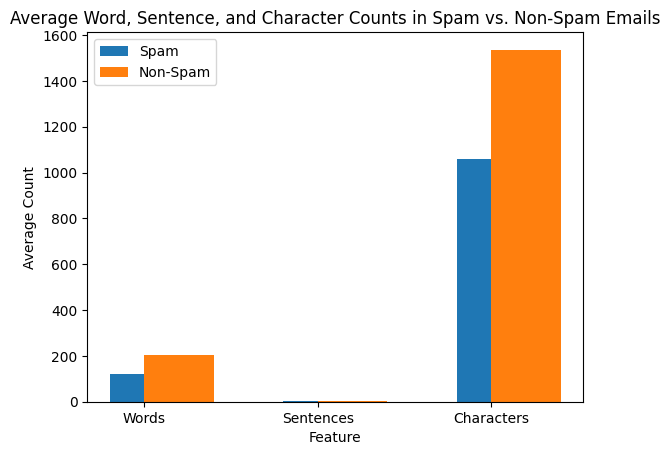

In [13]:
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

# Ensure the necessary NLTK data files are downloaded
nltk.download('punkt')

# Function to count words, sentences, and characters
def count_text_features(text):
    words = word_tokenize(text)
    sentences = sent_tokenize(text)
    characters = len(text)
    return len(words), len(sentences), characters

# Apply the function to each email
df[['word_count', 'sentence_count', 'char_count']] = df['text_combined'].apply(lambda x: pd.Series(count_text_features(str(x))))

# Calculate average words, sentences, and characters counts for spam and non-spam emails
avg_word_count_spam = df[df['label'] == 1]['word_count'].mean()
avg_word_count_non_spam = df[df['label'] == 0]['word_count'].mean()
avg_sentence_count_spam = df[df['label'] == 1]['sentence_count'].mean()
avg_sentence_count_non_spam = df[df['label'] == 0]['sentence_count'].mean()
avg_char_count_spam = df[df['label'] == 1]['char_count'].mean()
avg_char_count_non_spam = df[df['label'] == 0]['char_count'].mean()

# Print the means
print(f"Average word count in spam emails: {avg_word_count_spam}")
print(f"Average word count in non-spam emails: {avg_word_count_non_spam}")
print(f"Average sentence count in spam emails: {avg_sentence_count_spam}")
print(f"Average sentence count in non-spam emails: {avg_sentence_count_non_spam}")
print(f"Average character count in spam emails: {avg_char_count_spam}")
print(f"Average character count in non-spam emails: {avg_char_count_non_spam}")

# Combine all the data
labels = ['Words', 'Sentences', 'Characters']
spam_counts = [avg_word_count_spam, avg_sentence_count_spam, avg_char_count_spam]
non_spam_counts = [avg_word_count_non_spam, avg_sentence_count_non_spam, avg_char_count_non_spam]

# Plotting the results
x = range(len(labels))

fig, ax = plt.subplots()
ax.bar(x, spam_counts, width=0.4, label='Spam', align='center')
ax.bar(x, non_spam_counts, width=0.4, label='Non-Spam', align='edge')
ax.set_xlabel('Feature')
ax.set_ylabel('Average Count')
ax.set_title('Average Word, Sentence, and Character Counts in Spam vs. Non-Spam Emails')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.show()


### We see that there's no vialble difference in the sentences, so we'll drop the feature

In [14]:
# df = df.drop(['sentence_count'], axis =1)

# Creating a corr matrix

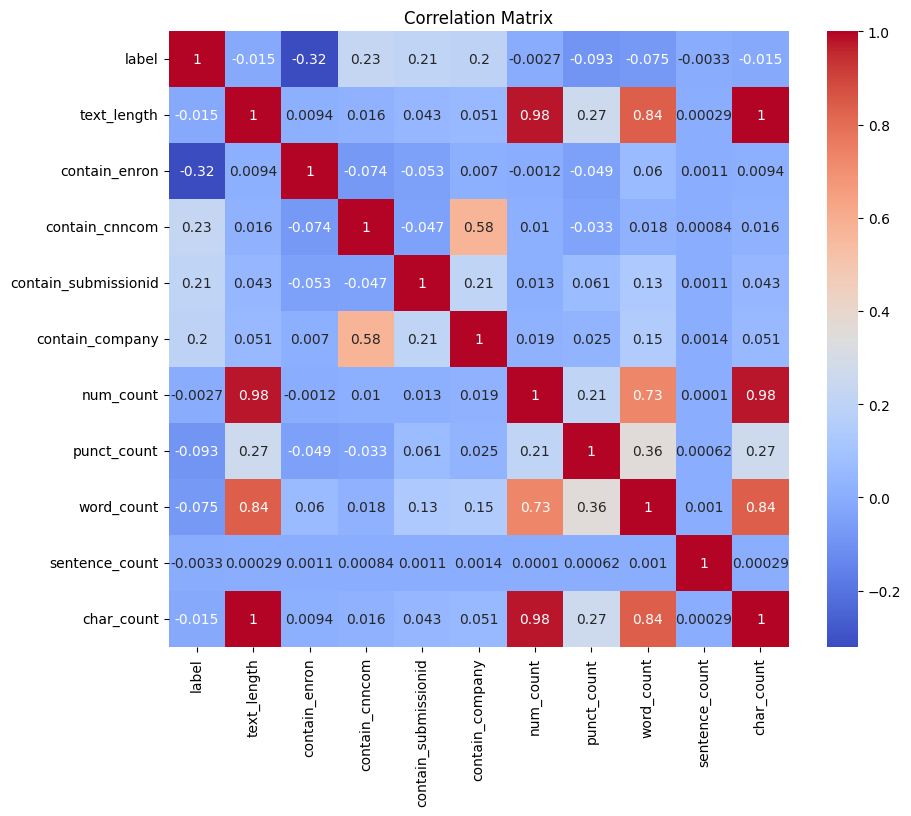

In [15]:
numerical_df = df.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# We see that the 'text_length' and 'char_count' columns are highly correlated, we decide to drop the 'char_count' column.

In [16]:
df = df.drop(['char_count', 'num_count'], axis =1)

## check words in clusters

In [3]:
pip install bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 1.5 MB/s eta 0:00:00


In [8]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import OnlineCountVectorizer

vectorizer_model = OnlineCountVectorizer()
topic_model = BERTopic(vectorizer_model= vectorizer_model)
topics, probs = topic_model.fit_transform(df['text_combined'])

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [9]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,26931,-1_ect_hou_cc_vince,"[ect, hou, cc, vince, subject, avg, kaminski, ...",[david pennock sdfbizteyahooinccom final remin...
1,0,1114,0_language_linguistics_languages_linguistic,"[language, linguistics, languages, linguistic,...",[uilots utrecht second announcement call paper...
2,1,820,1_soros_dimension_httpmilddearcom_enhancement,"[soros, dimension, httpmilddearcom, enhancemen...",[roman waters romanengepluscombr worrying futu...
3,2,767,2_health_medications_licensed_consultations,"[health, medications, licensed, consultations,...",[goldie gogerty oflshutconeillcom night full p...
4,3,767,3_replica_watches_classics_rolex,"[replica, watches, classics, rolex, watch, qua...",[austin barker nickgrenoblepagewileyreincom re...
...,...,...,...,...,...
1175,1174,10,1174_molly_vince_magee_kaminski,"[molly, vince, magee, kaminski, youyi, krishna...",[hello molly kim watson would like us bring ja...
1176,1175,10,1175_fontfont_trebuchet_font_arial,"[fontfont, trebuchet, font, arial, lpt, face, ...",[nan paying 3 6 mortgage slash payment must ow...
1177,1176,10,1176_marbella_drdavid_fidelity_ellis,"[marbella, drdavid, fidelity, ellis, goodday, ...",[drdavid bryan ellis drbryanelliscorporateeuro...
1178,1177,10,1177_mobil_beaumont_midcon_rebecca,"[mobil, beaumont, midcon, rebecca, marol, mmbt...",[mobil beaumont marol rebecca mobil march begi...


In [10]:
topic_model.get_topic(0)

[('language', 0.00896232077747216),
 ('linguistics', 0.008187116865908822),
 ('languages', 0.005613917396938211),
 ('linguistic', 0.005477572073690132),
 ('english', 0.005320765337926651),
 ('1998', 0.004691190744034479),
 ('university', 0.0045785805327151876),
 ('discourse', 0.004184937560610564),
 ('edu', 0.004168102530781636),
 ('grammar', 0.00408091066212626)]

In [12]:
topic_model.visualize_topics()

In [11]:
# df2 = pd.DataFrame({"topic" : topics,"document": df['text_combined'],"labls":df['label']})
# df2.to_csv('BERTopic_data.csv')